# Descrizione dei dataset

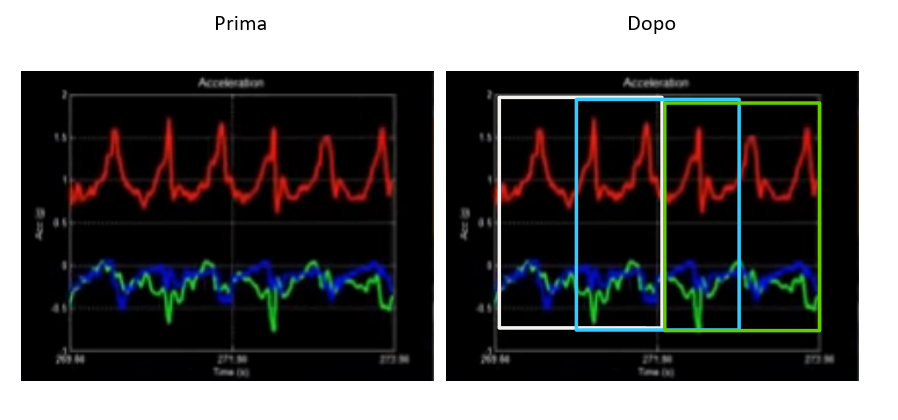

L'immagine dell'onda dell'accelerometro è presa dal video linkato nello studio originario (le tre onde corrispondono alle componenti X, Y e Z). I dati sono stati generati partizionando le onde in intervalli temporali fissi di 2.56 secondi ciascuno (windows). Ogni finestra si sovrappone per il 50% a quella precedente (sliding windows) andando quindi a riprendere i suoi ultimi 1.28 secondi. Per ogni finestra sono state fatte 128 letture (readings), questo significa che l'accelerazione lineare (ad esempio) in ogni finestra viene misurata 1 volta ogni 2.64/128 secondi. Ogni record del dataset corrisponde ad una finestra. I dataset contenuti all'interno delle cartelle `Inertial Signals` contengono i record con 128 dimensioni (le misurazioni). Gli altri dataset, invece, contengono i record composti da 561 dimensioni, ognuna delle quali è ottenuta applicando un qualche tipo di misura sulla porzione dell'onda (queste dimensioni sono chiamate "engineered features"). I dati sono stati preprocessati applicando vari filtri alle onde e normalizzati nel range [-1, 1]. Il dataset è di tipo time series perché ogni partecipante è stato misurato nel corso del tempo. Infine, è stato effettuato un campionamento casuale semplice che ha diviso il dataset iniziale in train e test set (70-30). Il partizionamente è stato fatto sugli individui, per cui i dati presenti nei due dataset fanno riferimento a partecipanti diversi.

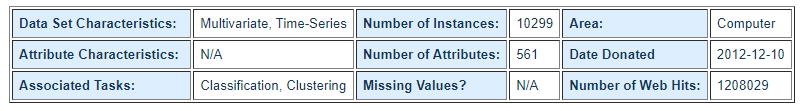

---

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib_inline.backend_inline
import seaborn as sns

---

# Dataset with engineered features

In [2]:
matplotlib_inline.backend_inline.set_matplotlib_formats('png', 'pdf')
plt.rcParams.update({'font.size': 12,
                     'xtick.labelsize' : 12,
                     'ytick.labelsize' : 12,
                     'axes.grid': False})

my_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [3]:
def row_error_count(df, subjects, perc = False):
    '''
    "df" contains only the reading columns. "subjects" is the 
    dataframe or the series containing the subjects associated with 
    each row of the df. The function returns a dictionary with the 
    subjects as keys and the number of errors as values. An error 
    occurs when two windows have at least one unequal reading in 
    the portion where they overlap.
    '''
    errors_dict = dict.fromkeys(np.unique(subjects), 0)
    for subject in errors_dict:
        subject_df = df.copy()
        subject_df['subject'] = subjects
        subject_df = subject_df[subject_df['subject'] == subject].reset_index(drop=True)
        '''
        for each subject, count the no. of records for which at least
        1 of the first 64 elements are equal to the last 64 elements 
        of the previous record.
        '''
        first64 = subject_df.iloc[1:, :64].values
        last64 = subject_df.iloc[:-1, 64:-1].values
        bool_mtx = (first64 != last64).all(axis = 1)
        errors_dict[subject] += bool_mtx.sum()
        if perc:
            errors_dict[subject] /= bool_mtx.shape[0]
    return errors_dict

In [4]:
def indices_errors(df, subjects):
    indices_dict = {}
    for subject in np.unique(subjects):
        subject_df = df.copy()
        subject_df['subject'] = subjects        
        subject_df = subject_df[subject_df['subject'] == subject].reset_index(drop=True)
        first64 = subject_df.iloc[1:, 63].values
        last64 = subject_df.iloc[:-1, 127].values
        bool_mtx = first64 == last64
        indeces = np.where(~bool_mtx)[0] + 1 # +1 since we skipped the first row
        for idx in indeces:
            indices_dict.setdefault(idx, 0) 
            indices_dict[idx] += 1
    return indices_dict

In [5]:
def error_count(df, subjects, perc = False):
    '''
    df contains only the reading columns.
    subjects is the dataframe or the series containing the subjects 
    associated with each row of the df.
    '''
    errors_dict = dict.fromkeys(np.unique(subjects), 0)
    for subject in errors_dict:
        subject_df = df.copy()
        subject_df['subject'] = subjects
        subject_df = subject_df[subject_df['subject'] == subject].reset_index(drop=True)
        # for each subject count the no. of errors
        first64 = subject_df.iloc[1:, :64].values
        last64 = subject_df.iloc[:-1, 64:-1].values
        bool_mtx = first64 != last64
        errors_dict[subject] += bool_mtx.sum()
        if perc:
            errors_dict[subject] /= bool_mtx.size
    return errors_dict

---

In [6]:
X_train = pd.read_fwf(".\X_train.txt", header = None)
X_test = pd.read_fwf(".\X_test.txt", header = None)
y_train = pd.read_fwf(".\y_train.txt", header = None) # df, not a series
y_test = pd.read_fwf(".\y_test.txt", header = None) # df, not a series

In [7]:
X_train.shape, y_train.shape

((7352, 561), (7352, 1))

In [8]:
X_test.shape, y_test.shape

((2947, 561), (2947, 1))

In [9]:
X_train.shape[0] + X_test.shape[0]

10299

In [10]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7352 entries, 0 to 7351
Columns: 561 entries, 0 to 560
dtypes: float64(561)
memory usage: 31.5 MB


In [11]:
X_train.isnull().sum(axis = 1).sum()

0

Data Completeness: there are no null values. Missing values with 
different marks should also be excluded since the dtypes is float64.

In [12]:
# show all columns

pd.set_option("display.max_columns", None)

In [13]:
X_train

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,-0.567378,-0.744413,0.852947,0.685845,0.814263,-0.965523,-0.999945,-0.999863,-0.994612,-0.994231,-0.987614,-0.943220,-0.407747,-0.679338,-0.602122,0.929294,-0.853011,0.359910,-0.058526,0.256892,-0.224848,0.264106,-0.095246,0.278851,-0.465085,0.491936,-0.190884,0.376314,0.435129,0.660790,0.963396,-0.140840,0.115375,-0.985250,-0.981708,-0.877625,-0.985001,-0.984416,-0.894677,0.892055,-0.161265,0.124660,0.977436,-0.123213,0.056483,-0.375426,0.899469,-0.970905,-0.975510,-0.984325,-0.988849,-0.917743,-1.000000,-1.0,0.113806,-0.590425,0.591146,-0.591773,0.592469,-0.745449,0.720862,-0.712372,0.711300,-0.995112,0.995675,-0.995668,0.991653,0.570222,0.439027,0.986913,0.077996,0.005001,-0.067831,-0.993519,-0.988360,-0.993575,-0.994488,-0.986207,-0.992818,-0.985180,-0.991994,-0.993119,0.989835,0.991957,0.990519,-0.993522,-0.999935,-0.999820,-0.999878,-0.994364,-0.986025,-0.989234,-0.819949,-0.793046,-0.888853,1.000000,-0.220747,0.636831,0.387644,0.241401,-0.052253,0.264177,0.373439,0.341778,-0.569791,0.265399,-0.477875,-0.385300,0.033644,-0.126511,-0.006101,-0.031365,0.107725,-0.985310,-0.976623,-0.992205,-0.984586,-0.976353,-0.992362,-0.867044,-0.933786,-0.747566,0.847308,0.914895,0.830841,-0.967184,-0.999578,-0.999354,-0.999763,-0.983438,-0.978614,-0.992966,0.082632,0.202268,-0.168757,0.096323,-0.274985,0.498644,-0.220317,1.000000,-0.972971,0.316655,0.375726,0.723399,-0.771112,0.690213,-0.331831,0.709584,0.134873,0.301099,-0.099167,-0.055517,-0.061986,-0.992111,-0.992519,-0.992055,-0.992165,-0.994942,-0.992619,-0.990156,-0.986743,-0.992042,0.994429,0.991756,0.989352,-0.994453,-0.999938,-0.999954,-0.999923,-0.992300,-0.996939,-0.992243,-0.589851,-0.688459,-0.572107,0.292376,-0.361998,0.405543,-0.039007,0.989284,-0.414560,0.391603,0.282251,0.9272

In [14]:
# X_train.hist(grid = False, bins = 30, figsize = (50,100))
# plt.savefig('hist_all.pdf', format = 'pdf', bbox_inches = 'tight')
# plt.show()

In [15]:
with open("features.txt") as f:
    lines = f.read().splitlines() 

The column names are difficult to handle thus instead of changing 
their names it is better to use a dictionary that maps each column number
to the corrisponding name.

In [16]:
features = {}
for line in lines:
    idx, name = line.split()
    features[int(idx)-1] = name
    
features

{0: 'tBodyAcc-mean()-X',
 1: 'tBodyAcc-mean()-Y',
 2: 'tBodyAcc-mean()-Z',
 3: 'tBodyAcc-std()-X',
 4: 'tBodyAcc-std()-Y',
 5: 'tBodyAcc-std()-Z',
 6: 'tBodyAcc-mad()-X',
 7: 'tBodyAcc-mad()-Y',
 8: 'tBodyAcc-mad()-Z',
 9: 'tBodyAcc-max()-X',
 10: 'tBodyAcc-max()-Y',
 11: 'tBodyAcc-max()-Z',
 12: 'tBodyAcc-min()-X',
 13: 'tBodyAcc-min()-Y',
 14: 'tBodyAcc-min()-Z',
 15: 'tBodyAcc-sma()',
 16: 'tBodyAcc-energy()-X',
 17: 'tBodyAcc-energy()-Y',
 18: 'tBodyAcc-energy()-Z',
 19: 'tBodyAcc-iqr()-X',
 20: 'tBodyAcc-iqr()-Y',
 21: 'tBodyAcc-iqr()-Z',
 22: 'tBodyAcc-entropy()-X',
 23: 'tBodyAcc-entropy()-Y',
 24: 'tBodyAcc-entropy()-Z',
 25: 'tBodyAcc-arCoeff()-X,1',
 26: 'tBodyAcc-arCoeff()-X,2',
 27: 'tBodyAcc-arCoeff()-X,3',
 28: 'tBodyAcc-arCoeff()-X,4',
 29: 'tBodyAcc-arCoeff()-Y,1',
 30: 'tBodyAcc-arCoeff()-Y,2',
 31: 'tBodyAcc-arCoeff()-Y,3',
 32: 'tBodyAcc-arCoeff()-Y,4',
 33: 'tBodyAcc-arCoeff()-Z,1',
 34: 'tBodyAcc-arCoeff()-Z,2',
 35: 'tBodyAcc-arCoeff()-Z,3',
 36: 'tBodyAcc-arCoeff

In [17]:
len(features)

561

In [18]:
X_train.min(axis = 1).min(), X_train.max(axis = 1).max()

(-1.0, 1.0)

In [19]:
X_train.describe().loc['min max mean std'.split(), :]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560
min,-1.000000,-1.000000,-1.000000,-1.000000,-0.999873,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000212,-1.000000,0.000650,-1.000000,-1.000000,-0.999999,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.925897,-0.963099,-1.000000,-0.822053,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.753754,-1.000000,-1.000000,-1.000000,-1.000000,-0.972219,-1.000000,-0.535222,-1.000000,-1.000000,-0.999830,-1.000000,-1.000000,-0.999849,-1.000000,-1.000000,-0.493874,-1.000000,-1.000000,-0.568157,-1.000000,-1.000000,-1.000000,-1.000000,-0.999999,-1.000000,-0.999946,-0.999969,-1.000000,-1.000000,-1.000000,-1.000000,0.000147,-1.000000,0.003250,-1.000000,-0.954173,-1.000000,-1.000000,-1.000000,-0.617636,-1.000000,0.000293,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.746907,0.000200,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.974838,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.799069,-1.000000,-1.000000,-1.000000,-1.000000,-0.959505,-0.914050,-0.851973,-0.902860,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.999915,-1.000000,-0.998014,-0.943439,-1.000000,0.000432,0.000051,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.999983,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.966591,-1.000000,-1.000000,-0.962539,-1.000000,-0.907178,-0.923388,-0.947304,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.999883,-1.000000,-1.000000,-0.999889,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000742,0.004533,0.001963,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.999658,-1.000000,-1.000000,-1.000000,-0.905918,-1.000000,-1

data accuracy: data are syntactically and semantically correct since all data are numerical and within their defined domain. However, since data are collected manually there could be measurement errors, trascription errors and, in general,  data precision could be limited.

In [20]:
with open('activity_labels.txt') as f:
    lines = f.read().splitlines()

activities = {}
for line in lines:
    label, activity = line.split()
    activities[int(label)] = activity

In [21]:
# 6-class classification problem

activities

{1: 'WALKING',
 2: 'WALKING_UPSTAIRS',
 3: 'WALKING_DOWNSTAIRS',
 4: 'SITTING',
 5: 'STANDING',
 6: 'LAYING'}

In [22]:
np.unique(y_train, return_counts = True)

(array([1, 2, 3, 4, 5, 6], dtype=int64),
 array([1226, 1073,  986, 1286, 1374, 1407], dtype=int64))

In [23]:
np.unique(y_test, return_counts = True)

(array([1, 2, 3, 4, 5, 6], dtype=int64),
 array([496, 471, 420, 491, 532, 537], dtype=int64))

Classes are quite balanced thus there is no need to use an 
imbalanced technique. The bar plot below suggests how much 
time overall participants spent doing the various activities.

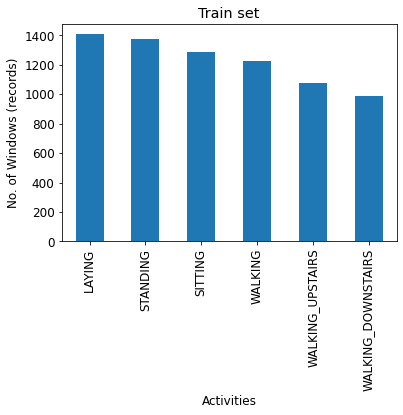

In [24]:
y_train_mapped = y_train[0].map(activities)
y_train_mapped.value_counts().plot.bar()
plt.ylabel('No. of Windows (records)')
plt.xlabel('Activities')
plt.title('Train set')
plt.show()

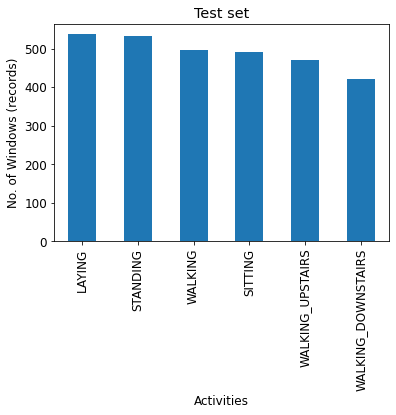

In [25]:
y_test_mapped = y_test[0].map(activities)
y_test_mapped.value_counts().plot.bar()
plt.ylabel('No. of Windows (records)')
plt.xlabel('Activities')
plt.title('Test set')
plt.show()

In [26]:
subject_train = pd.read_csv(".\subject_train.txt", header = None)
subject_test = pd.read_csv(".\subject_test.txt", header = None)

In [27]:
subject_train.shape, subject_test.shape

((7352, 1), (2947, 1))

The random sampling was conducteded on participants, not on the 
entire dataset (records). Therefore, data in train and test set 
refer to different persons. This means that in the classification 
tasks we have to suppose to predict the activity performed by an
unknown individual looking at the data generated by his smartphone.

Since each record is a window of 2.56s, we can compute the time
for each activity and for each partecipant. However we have to take into
account the fact that windows overlap each other for the 50% thus
we have to consider only the first 1.28s of each record but the last
that is considered entirely since it does not have successor.

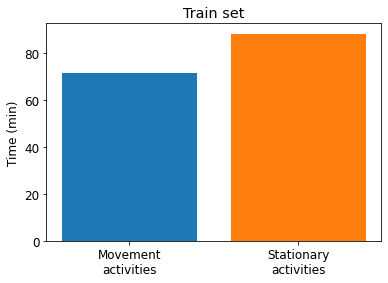

In [28]:
extra_time = 1.28 * np.unique(subject_train).size * 3 # for each subject and activity the lasat record should be counted entirely
mov_time = (y_train[0][y_train[0] < 4].count() * 1.28 + extra_time) / 60 
stat_time = (y_train[0][y_train[0] > 3].count() * 1.28 + extra_time) / 60

plt.bar(1, mov_time)
plt.bar(2, stat_time)
plt.ylabel('Time (min)')
plt.xticks([1,2], ['Movement\nactivities', 'Stationary\nactivities'])
plt.title('Train set')
plt.show()

It is strange that partecipants spent more time doing stationary
than movement activities.

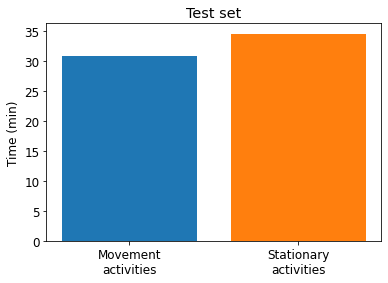

In [29]:
mov_time = (y_test[0][y_test[0] < 4].count() * 1.28 + extra_time) / 60
stat_time = (y_test[0][y_test[0] > 3].count() * 1.28 + extra_time) / 60

plt.bar(1, mov_time)
plt.bar(2, stat_time)
plt.ylabel('Time (min)')
plt.xticks([1,2], ['Movement\nactivities', 'Stationary\nactivities'])
plt.title('Test set')
plt.show()

In [30]:
print(np.unique(subject_train, return_counts = True), end = '\n\n')
print(np.unique(subject_test, return_counts = True))

(array([ 1,  3,  5,  6,  7,  8, 11, 14, 15, 16, 17, 19, 21, 22, 23, 25, 26,
       27, 28, 29, 30], dtype=int64), array([347, 341, 302, 325, 308, 281, 316, 323, 328, 366, 368, 360, 408,
       321, 372, 409, 392, 376, 382, 344, 383], dtype=int64))

(array([ 2,  4,  9, 10, 12, 13, 18, 20, 24], dtype=int64), array([302, 317, 288, 294, 320, 327, 364, 354, 381], dtype=int64))


For each partecipants we have roughly the same number of records. 
The differencies depend (probably) on the fact that they do not 
take exactly the same amount of time to perform the activities. 

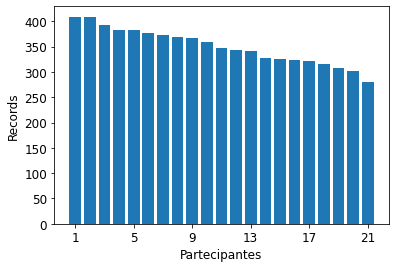

In [31]:
persons, n_records = np.unique(subject_train, return_counts = True)
rec = np.sort(n_records)[::-1]
n_partecipants = rec.size

plt.bar(range(1, n_partecipants + 1), rec)
plt.xticks(range(1, n_partecipants + 1, 4))
plt.ylabel('Records')
plt.xlabel('Partecipantes')
plt.show()

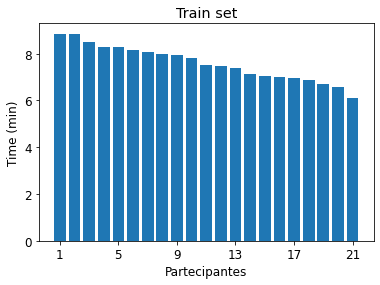

There are 21 participants in the train set.


In [32]:
persons, n_records = np.unique(subject_train, return_counts = True)
rec = (np.sort(n_records)[::-1] * 1.28 + 1.28*6) / 60
plt.bar(range(1, n_partecipants + 1), rec)

plt.ylabel('Time (min)')
plt.xlabel('Partecipantes')
plt.xticks(range(1,n_partecipants+1, 4))
plt.title('Train set')
plt.show()
print(f'There are {n_partecipants} participants in the train set.')

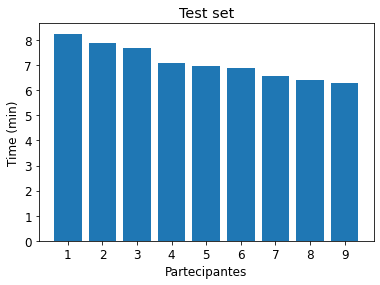

There are 9 partecipants in the test set.


In [33]:
persons, n_records = np.unique(subject_test, return_counts = True)
rec = (np.sort(n_records)[::-1] * 1.28 + 1.28*6) / 60
n_partecipants_test = rec.size
plt.bar(range(1, n_partecipants_test + 1), rec)

plt.ylabel('Time (min)')
plt.xlabel('Partecipantes')
plt.xticks(range(1,n_partecipants_test+1))
plt.title('Test set')
plt.show()
print(f'There are {n_partecipants_test} partecipants in the test set.')

In [34]:
my_color = sns.color_palette('RdBu_r', n_colors = 9, as_cmap = True)

In [35]:
corr_mtx = X_train.corr()
mask = (corr_mtx < -0.5) | (corr_mtx > 0.5)

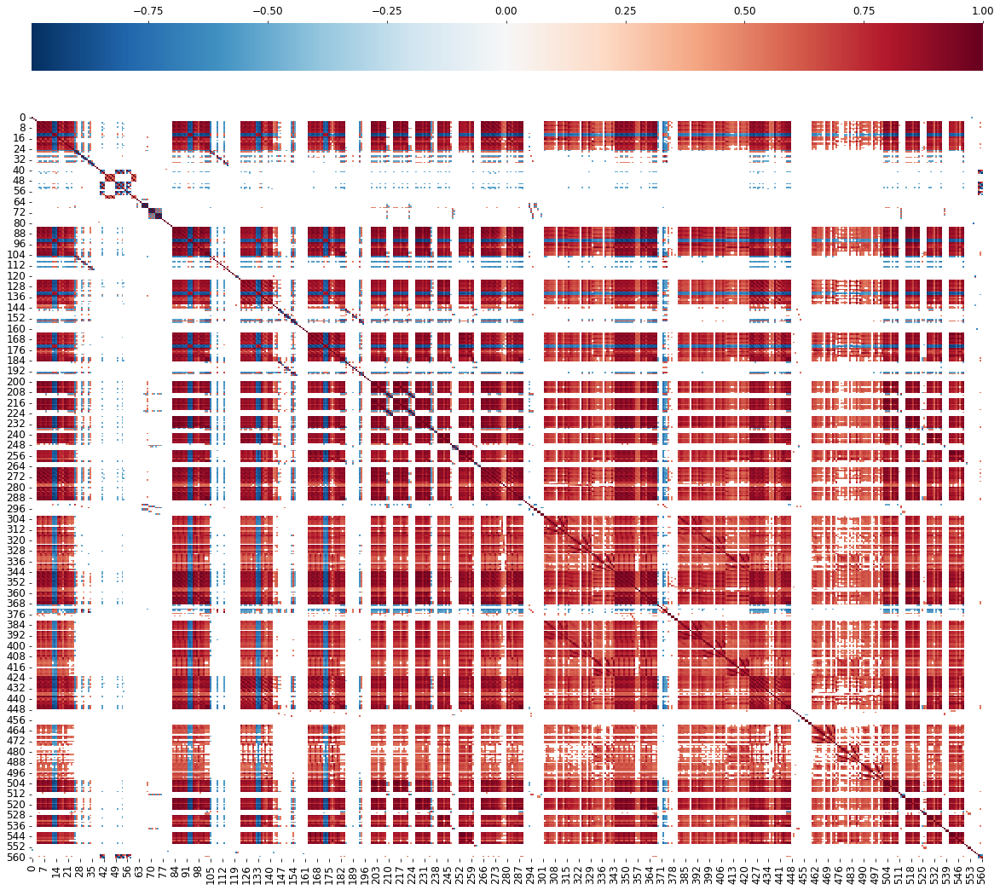

In [36]:
plt.figure(figsize = (20,20))
sns.heatmap(corr_mtx[mask], cmap = my_color, cbar_kws = {'location':'top'})
plt.show()

Variables are almost all highly correlated. In this scenario, when applying a DM algorithm, can be useful to use the Mahalanobis distance, that is a generalization of Euclidean distance defined as (see Tan et al., pag. 116):
$\mathrm{Mahalanobis}(\mathbf{x}, \mathbf{y}) = \sqrt{(\mathbf{x} -\mathbf{y})^T \Sigma^{-1} (\mathbf{x} -\mathbf{y})}$

where $\Sigma$ is the covariance matrix between the vectors $\mathbf{x}$ and $\mathbf{y}$

---

Let's now check whether there are columns with exactly the same values. Overall, the dataset has 561 features, hence there are $561 \choose 2$ possible combinations to check, that is $157080$ pairs of columns. If two columns are duplicated then they have the same mean, however, the opposite is not necessarily true. Therefore, to speed up the computation, we first identify columns with the same mean; successively, we compare the columns with the same mean entirely. 

In [189]:
from itertools import combinations

all_pair_attr = combinations(range(561), 2)

In [190]:
# columns with the same mean

medie = X_train.mean().values
same_mean = []
for attr1, attr2 in all_pair_attr:
    if medie[attr1] == medie[attr2]:
        same_mean.append((attr1, attr2))

In [192]:
# duplicated columns

duplicated = []
for attr1, attr2 in same_mean:
    if (X_train[attr1] == X_train[attr2]).all():
        duplicated.append((attr1, attr2))

In [193]:
duplicated

[(200, 205),
 (200, 213),
 (200, 218),
 (201, 214),
 (202, 215),
 (203, 216),
 (204, 217),
 (205, 213),
 (205, 218),
 (206, 219),
 (207, 220),
 (208, 221),
 (209, 222),
 (210, 223),
 (211, 224),
 (212, 225),
 (213, 218),
 (226, 231),
 (239, 244),
 (252, 257),
 (502, 507),
 (515, 520),
 (528, 533),
 (541, 546)]

In [206]:
dupl_dict = {}
already_seen = set()
for attr1, attr2 in duplicated:
    if attr1 not in already_seen:
        dupl_dict.setdefault(attr1, set()).add(attr2)
        already_seen.add(attr2)   

In [207]:
dupl_dict

{200: {205, 213, 218},
 201: {214},
 202: {215},
 203: {216},
 204: {217},
 206: {219},
 207: {220},
 208: {221},
 209: {222},
 210: {223},
 211: {224},
 212: {225},
 226: {231},
 239: {244},
 252: {257},
 502: {507},
 515: {520},
 528: {533},
 541: {546}}

In [213]:
print('Duplicated attribute groups:')
i = 0
for attr1, set_ in dupl_dict.items():
    print(f'\tGroup {i}:\n\t\t{features[attr1]}')
    i += 1
    for attr2 in set_:
        print(f'\t\t{features[attr2]}')        

Duplicated attribute groups:
	Group 0:
		tBodyAccMag-mean()
		tGravityAccMag-mean()
		tGravityAccMag-sma()
		tBodyAccMag-sma()
	Group 1:
		tBodyAccMag-std()
		tGravityAccMag-std()
	Group 2:
		tBodyAccMag-mad()
		tGravityAccMag-mad()
	Group 3:
		tBodyAccMag-max()
		tGravityAccMag-max()
	Group 4:
		tBodyAccMag-min()
		tGravityAccMag-min()
	Group 5:
		tBodyAccMag-energy()
		tGravityAccMag-energy()
	Group 6:
		tBodyAccMag-iqr()
		tGravityAccMag-iqr()
	Group 7:
		tBodyAccMag-entropy()
		tGravityAccMag-entropy()
	Group 8:
		tBodyAccMag-arCoeff()1
		tGravityAccMag-arCoeff()1
	Group 9:
		tBodyAccMag-arCoeff()2
		tGravityAccMag-arCoeff()2
	Group 10:
		tBodyAccMag-arCoeff()3
		tGravityAccMag-arCoeff()3
	Group 11:
		tBodyAccMag-arCoeff()4
		tGravityAccMag-arCoeff()4
	Group 12:
		tBodyAccJerkMag-mean()
		tBodyAccJerkMag-sma()
	Group 13:
		tBodyGyroMag-mean()
		tBodyGyroMag-sma()
	Group 14:
		tBodyGyroJerkMag-mean()
		tBodyGyroJerkMag-sma()
	Group 15:
		fBodyAccMag-mean()
		fBodyAccMag-sma()
	Group

For each group, we retain only the first attribute, while removing the remaining features from the dataset.

In [299]:
len(to_remove) = set()
for set_ in dupl_dict.values():
    to_remove.update(set_)

In [43]:
len(to_remove)

21

In [300]:
# remove redundant attributes

# X_train.drop(to_remove, axis = 1, inplace = True)
# X_test.drop(to_remove, axis = 1, inplace = True)

In [303]:
# save the new train and test set without redundant attribtes 

# X_train.to_csv('X_train_no_red.csv', index = False)
# X_test.to_csv('X_train_no_red.csv', index = False)

---

Here we compute the duplicate columns by using the an approach based on correlation.

In [288]:
corr_mtx = X_train.corr()

In [291]:
corr_unstack = corr_mtx.unstack()
mask = (corr_unstack == 1) | (corr_unstack == -1)
# mask = (corr_unstack > 0.95) | (corr_unstack < -0.95)
redundant_attr = corr_unstack[mask]
redundant_attr

0    0      1.0
1    1      1.0
2    2      1.0
3    3      1.0
4    4      1.0
           ... 
556  556    1.0
557  557    1.0
558  558    1.0
559  559    1.0
560  560    1.0
Length: 609, dtype: float64

In [292]:
# Do not consider self correlation
# The order must not be considered, i.e.: (200,205) and (205,200) are equivalent 

itself = {(i,i) for i in range(561)}
mask1 = [idx for idx in redundant_attr.index if idx not in itself] # no self correlation
mask2 = set() # do not consider the order
for idx1, idx2 in mask1:
    if (idx2, idx1) not in mask2:
        mask2.add((idx1, idx2))

redundant_attr.loc[mask2].sort_index()

200  205    1.0
     213    1.0
     218    1.0
201  214    1.0
202  215    1.0
203  216    1.0
204  217    1.0
205  213    1.0
     218    1.0
206  219    1.0
207  220    1.0
208  221    1.0
209  222    1.0
210  223    1.0
211  224    1.0
212  225    1.0
213  218    1.0
226  231    1.0
239  244    1.0
252  257    1.0
502  507    1.0
515  520    1.0
528  533    1.0
541  546    1.0
dtype: float64

In [293]:
set(duplicated) == set(redundant_attr.loc[mask2].sort_index().index)

True

---

In [37]:
# with pd.option_context("display.max_rows", 10000): 
#     display(corr_mtx[mask])

# Dataset with inertial signals

In [38]:
# total accelerating signals

tot_acc_x = pd.read_fwf(r".\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals\total_acc_x_train.txt", header = None)
tot_acc_y = pd.read_fwf(r".\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals\total_acc_y_train.txt", header = None)
tot_acc_z = pd.read_fwf(r".\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals\total_acc_z_train.txt", header = None)

In [39]:
tot_acc_x

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127
0,1.012817,1.022833,1.022028,1.017877,1.023680,1.016974,1.017746,1.019263,1.016417,1.020745,1.018643,1.019521,1.020260,1.018041,1.020829,1.018644,1.019398,1.020399,1.019222,1.022093,1.020433,1.020534,1.021503,1.019931,1.020480,1.018945,1.019238,1.019989,1.018917,1.019762,1.019021,1.017887,1.018136,1.019543,1.020242,1.018757,1.019534,1.019862,1.019060,1.020717,1.021055,1.020178,1.018108,1.014776,1.015374,1.018429,1.019895,1.018647,1.016387,1.017053,1.019572,1.021097,1.019488,1.017218,1.019876,1.022022,1.020574,1.021588,1.022298,1.019369,1.016980,1.016774,1.016079,1.015292,1.018851,1.022380,1.020781,1.020218,1.021344,1.020522,1.019790,1.019216,1.018307,1.017996,1.017932,1.018121,1.018305,1.018458,1.018201,1.017129,1.017814,1.018800,1.017601,1.017970,1.018489,1.017787,1.019167,1.019789,1.019462,1.020433,1.021189,1.021903,1.021936,1.020550,1.018878,1.018548,1.017389,1.015021,1.019310,1.024606,1.021863,1.020201,1.020573,1.018729,1.019360,1.019954,1.018969,1.019633,1.019553,1.019179,1.019695,1.019145,1.018516,1.017926,1.017780,1.018917,1.020606,1.022583,1.020981,1.018065,1.019638,1.020017,1.018766,1.019815,1.019290,1.018445,1.019372,1.021171
1,1.018851,1.022380,1.020781,1.020218,1.021344,1.020522,1.019790,1.019216,1.018307,1.017996,1.017932,1.018121,1.018305,1.018458,1.018201,1.017129,1.017814,1.018800,1.017601,1.017970,1.018489,1.017787,1.019167,1.019789,1.019462,1.020433,1.021189,1.021903,1.021936,1.020550,1.018878,1.018548,1.017389,1.015021,1.019310,1.024606,1.021863,1.020201,1.020573,1.018729,1.019360,1.019954,1.018969,1.019633,1.019553,1.019179,1.019695,1.019145,1.018516,1.017926,1.017780,1.018917,1.020606,1.022583,1.020981,1.018065,1.019638,1.020017,1.018766,1.019815,1.019290,1.018445,1.019372,1.021171,1.023127,1.021882,1.019178,1.015861,1.012893,1.016451,1.020331,1.020266,1.021759,1.018649,1.013117,1.016167,1.018977,1.016653,1.017782,1.020528,1.021877,1.022096,1.020731,1.020761,1.020405,1.020213,1.021675,1.019989,1.017997,1.017391,1.017994,1.021661,1.022348,1.020336,1.019066,1.018882,1.020013,1.018262,1.017474,1.018954,1.019628,1.022794,1.024238,1.022783,1.020487,1.018146,1.019779,1.019922,1.018709,1.019980,1.019301,1.019243,1.020169,1.020892,1.022771,1.021553,1.019811,1.020246,1.019291,1.019258,1.020736,1.020950,1.020491,1.018685,1.015660,1.014788,1.016499,1.017849
2,1.023127,1.021882,1.019178,1.015861,1.012893,1.016451,1.020331,1.020266,1.021759,1.018649,1.013117,1.016167,1.018977,1.016653,1.017782,1.020528,1.021877,1.022096,1.020731,1.020761,1.020405,1.020213,1.021675,1.019989,1.017997,1.017391,1.017994,1.021661,1.022348,1.020336,1.019066,1.018882,1.020013,1.018262,1.017474,1.018954,1.019628,1.022794,1.024238,1.022783,1.020487,1.018146,1.019779,1.019922,1.018709,1.019980,1.019301,1.019243,1.020169,1.020892,1.022771,1.021553,1.019811,1.020246,1.019291,1.019258,1.020736,1.020950,1.020491,1.018685,1.015660,1.014788,1.016499,1.017849,1.017682,1.018149,1.019854,1.019880,1.019121,1.020479,1.020595,1.016340,1.010611,1.009013,1.015016,1.024026,1.027664,1.022425,1.015007,1.014774,1.017851,1.019387,1.021093,1.022092,1.024232,1.025311,1.022033,1.020125,1.021580,1.022957,1.022148,1.021799,1.022725,1.021780,1.020903,1.019081,1.017221,1.019547,1.021770,1.022134,1.020713,1.018487,1.020331,1.024399,1.026768,1.023704,1.016694,1.014855,1.017545,1.022063,1.026897,1.025257,1.022442,1.022451,1.020104,1.020140,1.020892,1.018699,1.020304,1.021516,1.019417,1.019312,1.019448,1.019434,1.019916,1.021041,1.022935,1.022019
3,1.017682,1.018149,1.019854,1.019880,1.019121,1.020479,1.020595,1.016340,1.010611,1.009013,1.015016,1.024026,1.027664,1.022425,1.01500

In [40]:
# this dataset is not normalized in [-1,1]. Why?

tot_acc_x.describe().loc[['min', 'max'], :]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127
min,-0.405665,-0.399891,-0.407309,-0.407379,-0.406735,-0.407835,-0.409223,-0.414690,-0.411853,-0.433381,-0.441969,-0.394386,-0.392068,-0.379886,-0.368787,-0.375645,-0.379044,-0.378539,-0.376263,-0.376197,-0.372471,-0.379164,-0.389563,-0.399741,-0.397017,-0.384455,-0.383353,-0.395043,-0.416227,-0.466556,-0.439630,-0.409241,-0.397527,-0.381714,-0.377381,-0.380167,-0.392659,-0.399705,-0.394206,-0.387621,-0.388282,-0.400879,-0.415107,-0.418676,-0.408018,-0.398325,-0.400038,-0.399404,-0.396255,-0.394996,-0.404304,-0.430733,-0.445410,-0.431365,-0.415513,-0.415194,-0.410080,-0.406213,-0.418298,-0.420371,-0.419780,-0.422794,-0.415148,-0.411995,-0.405280,-0.399891,-0.407309,-0.407379,-0.406735,-0.407835,-0.409223,-0.414690,-0.411853,-0.433381,-0.441969,-0.394386,-0.392068,-0.379886,-0.368787,-0.375645,-0.379044,-0.378539,-0.376263,-0.376197,-0.372471,-0.379164,-0.389563,-0.399741,-0.397017,-0.384455,-0.383353,-0.395043,-0.416227,-0.466556,-0.439630,-0.409241,-0.397527,-0.381714,-0.377381,-0.380167,-0.392659,-0.399705,-0.394206,-0.387621,-0.388282,-0.400879,-0.415107,-0.418676,-0.408018,-0.398325,-0.400038,-0.399404,-0.396255,-0.394996,-0.404304,-0.430733,-0.445410,-0.431365,-0.415513,-0.415194,-0.410080,-0.406213,-0.418298,-0.420371,-0.419780,-0.422794,-0.415148,-0.411995
max,2.104388,2.074192,2.083785,2.032520,2.109117,2.058101,2.125131,2.034239,2.073188,2.048707,2.040518,2.058321,2.092807,2.068193,2.079376,2.080023,2.106871,2.055902,2.001611,2.052369,2.061487,2.058555,1.990631,2.065888,2.044380,2.047493,2.015528,2.015575,2.035548,2.012726,1.992795,2.066813,2.050561,2.034145,2.019503,2.045124,2.051511,2.053264,2.017677,2.076836,2.037749,2.033855,2.028467,2.046888,2.052662,2.004502,2.080794,2.078614,2.091745,2.062610,2.076054,2.057529,2.059403,2.038457,2.050219,2.032361,2.157473,2.120588,2.064136,2.128677,2.072014,2.057935,2.033207,2.060867,2.104388,2.071328,2.083785,2.008092,2.109117,2.058101,2.125131,2.034239,2.073188,2.118326,2.040518,2.078943,2.092807,2.068193,2.023251,2.041389,2.106871,2.055902,2.037538,2.041421,2.061487,2.058555,1.990631,2.065888,2.044380,2.082583,2.077116,2.015575,2.035548,2.016878,1.992795,2.082028,2.033794,2.034145,2.019503,2.064400,2.093789,2.072127,2.064526,2.076836,2.032366,2.033855,2.028467,2.046888,2.197618,2.109241,2.080794,2.078614,2.091745,2.076233,2.076054,2.057529,2.059403,2.027154,2.050219,2.032361,2.157473,2.120588,2.064136,2.128677,2.072014,2.146415,2.119598,2.060867


For each record, the initial 64 readings should be equal to the last 64 readings of the previous record. However, this does not always happen. The errors occur for the same windows for three components of the acceleration signal.

In [41]:
# total accelerating x axis

x_row_errors = row_error_count(tot_acc_x, subject_train)
x_row_errors

{1: 32,
 3: 28,
 5: 27,
 6: 27,
 7: 27,
 8: 28,
 11: 28,
 14: 27,
 15: 27,
 16: 27,
 17: 28,
 19: 27,
 21: 27,
 22: 27,
 23: 27,
 25: 27,
 26: 26,
 27: 28,
 28: 28,
 29: 28,
 30: 27}

In [42]:
# total accelerating y axis

y_row_errors = row_error_count(tot_acc_y, subject_train)
y_row_errors

{1: 32,
 3: 28,
 5: 27,
 6: 27,
 7: 27,
 8: 28,
 11: 28,
 14: 27,
 15: 27,
 16: 27,
 17: 28,
 19: 27,
 21: 27,
 22: 27,
 23: 27,
 25: 27,
 26: 27,
 27: 28,
 28: 28,
 29: 28,
 30: 27}

In [43]:
# total accelerating z axis

z_row_errors = row_error_count(tot_acc_z, subject_train)
z_row_errors

{1: 32,
 3: 28,
 5: 27,
 6: 27,
 7: 27,
 8: 28,
 11: 28,
 14: 27,
 15: 27,
 16: 27,
 17: 28,
 19: 27,
 21: 27,
 22: 27,
 23: 27,
 25: 27,
 26: 27,
 27: 28,
 28: 28,
 29: 28,
 30: 27}

In [44]:
# overall row errors

sum(x_row_errors.values())

578

This might depend on measurement or transcription errors.  For instance, if we consider the subject number 30 and compare the 64th reading of each row with the 128th of the previous row we can see that different errors occur.

In [46]:
idx_30_subj = subject_train.loc[subject_train[0] == 30].index
subject_30 = tot_acc_x.loc[idx_30_subj]

In [47]:
a = subject_30.reset_index(drop=True).iloc[1:, 63].values
b = subject_30.reset_index(drop=True).iloc[:-1, 127].values

a == b

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [48]:
mask = a != b
print(a[mask], b[mask], sep = '\n\n')

[1.008987   0.9963193  0.9914234  0.0730181  0.1218222  0.8529786
 1.145608   1.193699   0.923416   0.9430287  0.8983176  0.9285214
 0.9560641  1.026154   1.023905   0.7245159  1.002709   0.09360422
 0.0193818  1.176819   1.071356   0.7825454  0.8130076  0.5450142
 1.349572   1.017875   0.8982843 ]

[1.016832   1.013625   0.8298435  0.9996539  0.07185781 0.1758897
 0.975847   0.9402395  0.8749597  1.057679   0.8667417  0.9993818
 0.7904323  1.298497   1.024059   1.018443   0.7401186  0.9888762
 0.07160294 0.03596537 0.8399152  0.8058427  0.8524033  1.402756
 1.252454   1.325731   0.7724884 ]


Let's see which indices are affected by errors

In [49]:
indices_errors(tot_acc_x, subject_train)

{14: 1,
 27: 3,
 38: 2,
 51: 4,
 64: 1,
 78: 2,
 86: 3,
 98: 1,
 111: 5,
 125: 2,
 134: 6,
 142: 2,
 150: 4,
 158: 3,
 167: 5,
 176: 3,
 190: 3,
 202: 2,
 213: 1,
 225: 2,
 237: 1,
 248: 2,
 256: 3,
 269: 4,
 282: 3,
 296: 3,
 298: 2,
 303: 1,
 312: 3,
 321: 2,
 330: 1,
 339: 2,
 16: 1,
 31: 2,
 43: 3,
 57: 2,
 71: 3,
 87: 2,
 103: 1,
 118: 2,
 126: 2,
 141: 4,
 175: 2,
 189: 3,
 205: 4,
 217: 1,
 231: 4,
 247: 2,
 263: 1,
 277: 1,
 290: 3,
 299: 2,
 308: 1,
 316: 1,
 325: 3,
 333: 1,
 15: 3,
 28: 2,
 39: 2,
 65: 1,
 79: 1,
 95: 1,
 109: 2,
 143: 3,
 151: 3,
 159: 4,
 173: 3,
 187: 3,
 198: 2,
 208: 5,
 220: 3,
 232: 1,
 245: 1,
 258: 3,
 266: 1,
 273: 4,
 280: 2,
 288: 3,
 295: 1,
 13: 3,
 30: 4,
 45: 3,
 59: 5,
 72: 1,
 102: 4,
 116: 3,
 124: 1,
 132: 1,
 140: 2,
 149: 3,
 157: 1,
 166: 3,
 180: 2,
 193: 2,
 219: 3,
 233: 3,
 262: 1,
 276: 2,
 284: 2,
 292: 4,
 300: 3,
 309: 3,
 317: 2,
 40: 1,
 54: 3,
 68: 3,
 81: 2,
 96: 1,
 110: 1,
 120: 3,
 128: 6,
 135: 2,
 145: 3,
 153: 5,
 161

it is quite strange that errors often occur during the same reading.

In [50]:
errors = list(indices_errors(tot_acc_x, subject_train).values())
np.unique(errors, return_counts = True)

# k = idx_errors.keys()
# v = idx_errors.values()
# plt.bar(k,v)
# plt.show()                            

(array([1, 2, 3, 4, 5, 6]), array([118,  89,  60,  14,   7,   2], dtype=int64))

Let's count the single errors

In [51]:
error_count(tot_acc_x, subject_train)

{1: 2048,
 3: 1792,
 5: 1728,
 6: 1728,
 7: 1728,
 8: 1792,
 11: 1792,
 14: 1728,
 15: 1728,
 16: 1728,
 17: 1792,
 19: 1728,
 21: 1728,
 22: 1728,
 23: 1728,
 25: 1728,
 26: 1727,
 27: 1792,
 28: 1792,
 29: 1792,
 30: 1728}

Let's consider only the first 64 readings of each window. However, we have also to take into account the last 64 readings of the last record since it is not repeated. Moreover, the subjects and activities columns are added.

In [52]:
df_dict = {'tot_acc_x':tot_acc_x, 
           'tot_acc_y':tot_acc_y, 
           'tot_acc_z':tot_acc_z,}

for name_df, df in df_dict.items():
    last_row = df.iloc[-1:,64:].rename(
        columns=dict(zip(range(64,128), range(65)))) 
    first64 = df.iloc[:,:64]
    df_dict[name_df] = pd.concat([first64, last_row], ignore_index=True)
    '''
    add the last 64 readings of the last record. Since the dataset has
    1 more record, we have to fill the subject and the activity field.
    '''
    df_dict[name_df]['subject'] = subject_train
    df_dict[name_df]['activity'] = y_train_mapped
    df_dict[name_df].iloc[-1, -2:] = df_dict[name_df].iloc[-2, -2:]

In [53]:
subj_readings = df_dict['tot_acc_x'].groupby('subject').size()
print(subj_readings.max())
subj_readings

409


subject
1.0     347
3.0     341
5.0     302
6.0     325
7.0     308
8.0     281
11.0    316
14.0    323
15.0    328
16.0    366
17.0    368
19.0    360
21.0    408
22.0    321
23.0    372
25.0    409
26.0    392
27.0    376
28.0    382
29.0    344
30.0    384
dtype: int64

Let's try to rebuild the 3-axial linear acceleration for the subject j.
The sensor makes a reading each 1.28sec/64 = 0.02 sec.

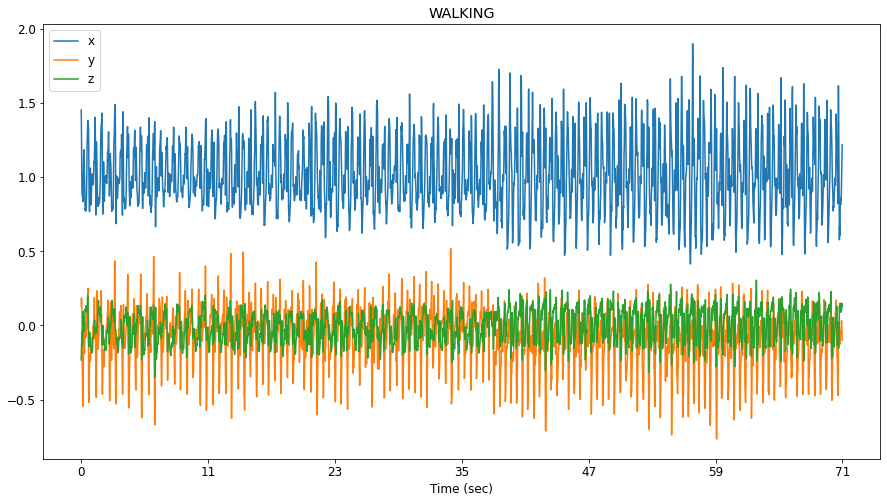

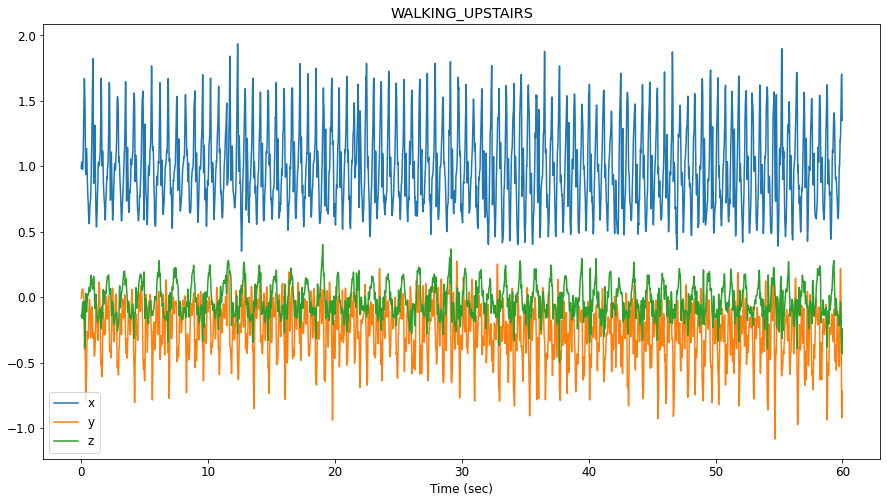

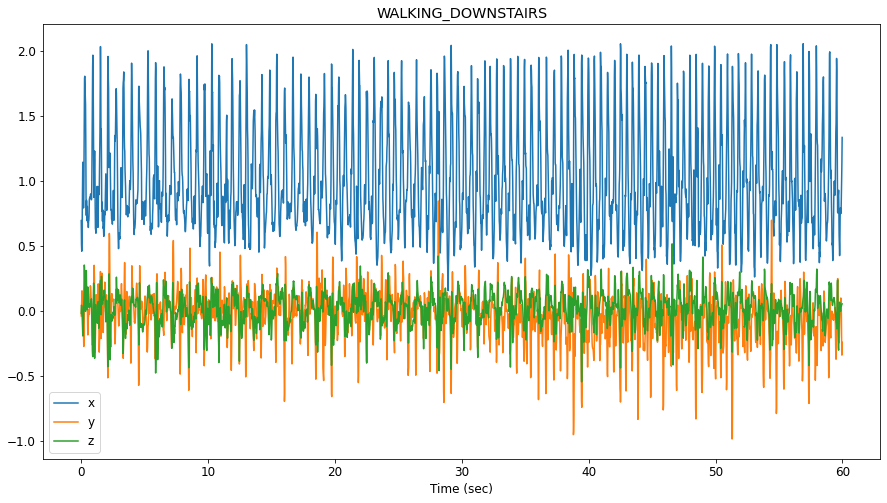

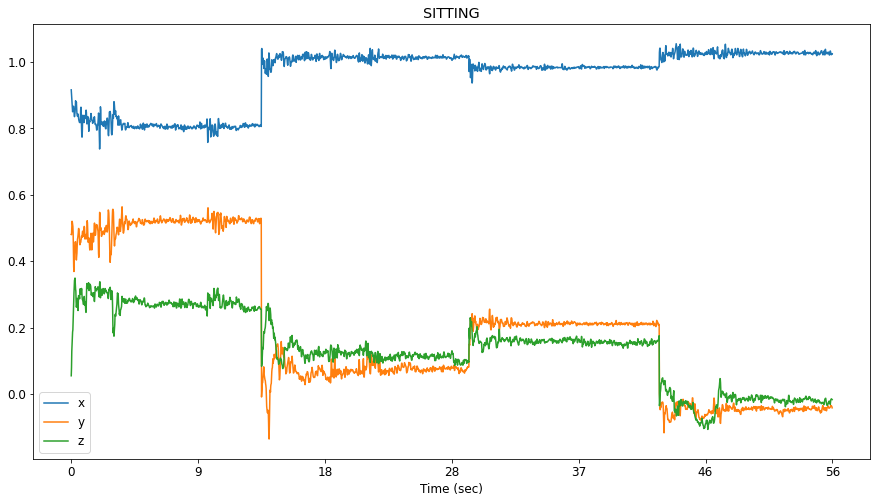

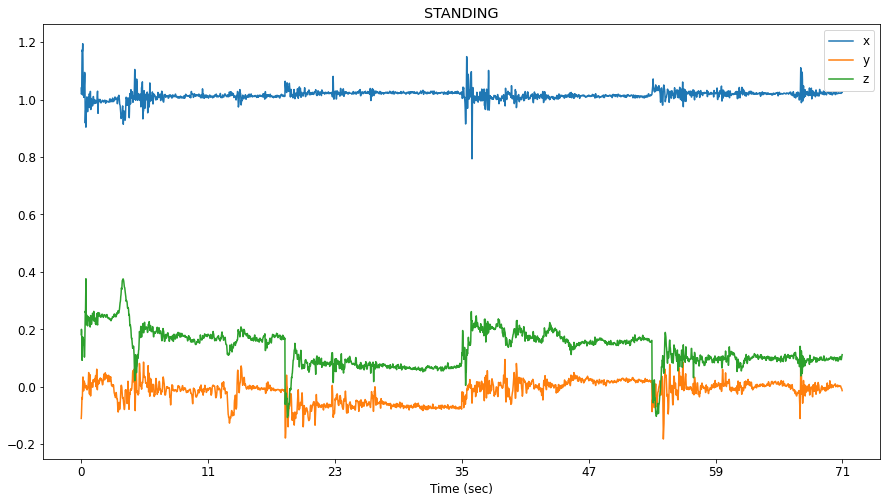

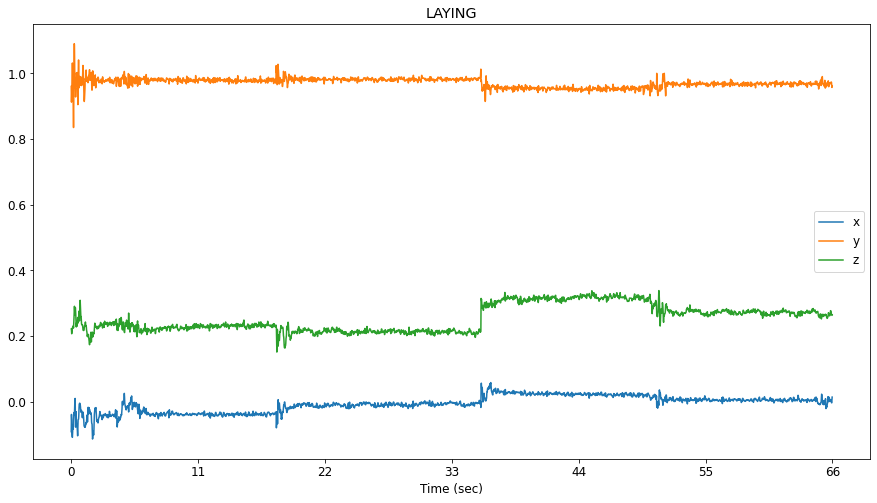

In [54]:
j = 5
mask = df_dict['tot_acc_x']['subject'] == j
x_subject_j = df_dict['tot_acc_x'][mask]
y_subject_j = df_dict['tot_acc_y'][mask]
z_subject_j = df_dict['tot_acc_z'][mask]
for activity in activities.values():
    plt.figure(figsize=(15,8))
    mask = x_subject_j['activity'] == activity
    x = x_subject_j[mask].iloc[:, :-2].values.reshape(-1)
    y = y_subject_j[mask].iloc[:, :-2].values.reshape(-1)
    z = z_subject_j[mask].iloc[:, :-2].values.reshape(-1)
    plt.plot(x, label = 'x')
    plt.plot(y, label = 'y')
    plt.plot(z, label = 'z')
    plt.xticks(np.linspace(0, x.size, 7), np.linspace(0, x.size*0.02, 7, dtype=int))
    plt.xlabel('Time (sec)')
    plt.legend()
    plt.title(activity)
    plt.show()

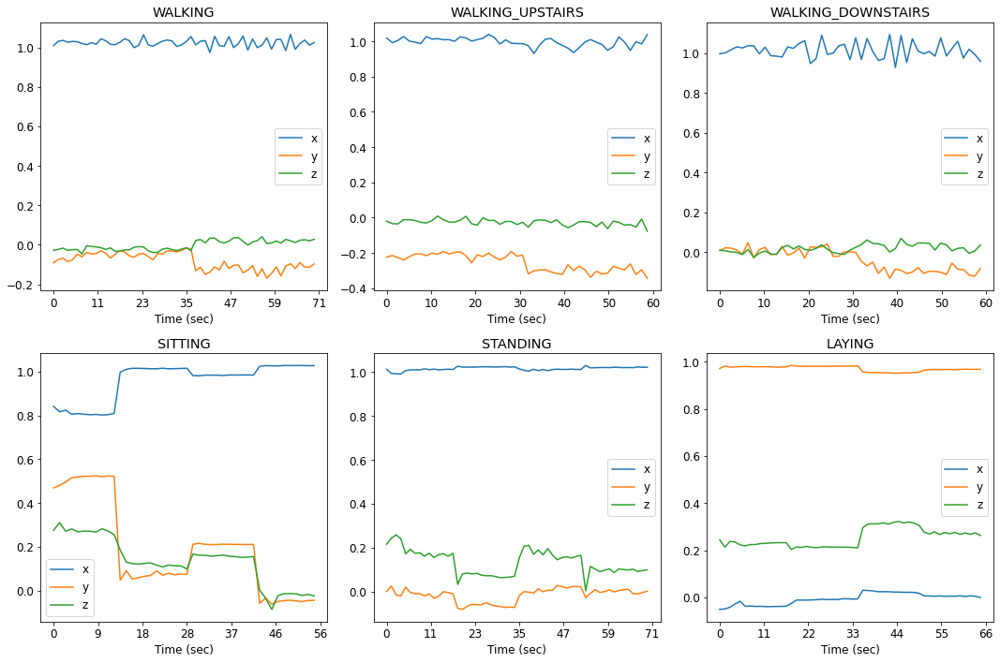

In [55]:
# we take 1 reading for each window: the mean

j = 5
mask = df_dict['tot_acc_x']['subject'] == j
x_subject_j = df_dict['tot_acc_x'][mask]
y_subject_j = df_dict['tot_acc_y'][mask]
z_subject_j = df_dict['tot_acc_z'][mask]

plt.figure(figsize=(15,10))
for i, activity in enumerate(activities.values(), 1):
    plt.subplot(2,3,i)
    mask = x_subject_j['activity'] == activity
    x = x_subject_j[mask].iloc[:, :-2].values.mean(axis = 1).reshape(-1)
    y = y_subject_j[mask].iloc[:, :-2].values.mean(axis = 1).reshape(-1)
    z = z_subject_j[mask].iloc[:, :-2].values.mean(axis = 1).reshape(-1)
    plt.plot(x, label = 'x')
    plt.plot(y, label = 'y')
    plt.plot(z, label = 'z')
    plt.xticks(np.linspace(0, x.size, 7), np.linspace(0, x.size*1.28, 7, dtype=int))
    plt.xlabel('Time (sec)')
    plt.legend()
    plt.title(activity)
plt.tight_layout()
plt.show()

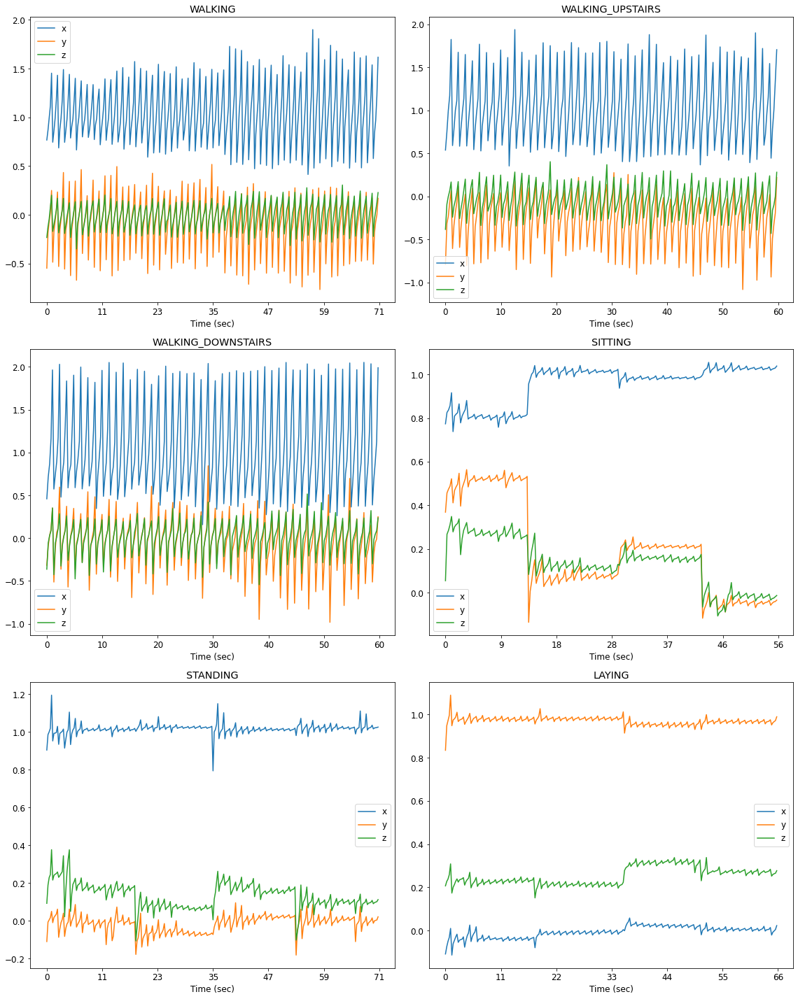

In [56]:
# we take 5 readings for each window: the min, the max and the 3 quartiles


j = 5
mask = df_dict['tot_acc_x']['subject'] == j
x_subject_j = df_dict['tot_acc_x'][mask]
y_subject_j = df_dict['tot_acc_y'][mask]
z_subject_j = df_dict['tot_acc_z'][mask]

plt.figure(figsize=(16,20))
for i, activity in enumerate(activities.values(), 1):
    plt.subplot(3,2,i)
    mask = x_subject_j['activity'] == activity
    x = x_subject_j[mask].iloc[:, :-2].quantile([0, 0.25,0.5,0.75, 1], axis = 1).values.T.reshape(-1)
    y = y_subject_j[mask].iloc[:, :-2].quantile([0, 0.25,0.5,0.75, 1], axis = 1).values.T.reshape(-1)
    z = z_subject_j[mask].iloc[:, :-2].quantile([0, 0.25,0.5,0.75, 1], axis = 1).values.T.reshape(-1)
    plt.plot(x, label = 'x')
    plt.plot(y, label = 'y')
    plt.plot(z, label = 'z')
    plt.xticks(np.linspace(0, x.size, 7), np.linspace(0, x.size*0.256, 7, dtype=int)) #1.28/5
    plt.xlabel('Time (sec)')
    plt.legend()
    plt.title(activity)
plt.tight_layout()
plt.show()

We can do the same considering the average subject, that is it is possible to do the mean among subjects. However, the problem is that we do not have the same number of windows for each subject. One possibility to solve this issue would be performing an undersampling. This would allow bringing the number of windows observed for each subject to those of the participants with fewer observations. Alternatively, we could perform an oversampling by bringing the cardinality of each subject to that of the participant having the largest number of observations.

## Body gyroscope

In [57]:
body_gyro_x = pd.read_fwf(r".\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals\body_gyro_x_train.txt", header = None)
body_gyro_y = pd.read_fwf(r".\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals\body_gyro_y_train.txt", header = None)
body_gyro_z = pd.read_fwf(r".\UCI HAR Dataset\UCI HAR Dataset\train\Inertial Signals\body_gyro_z_train.txt", header = None)

In [58]:
df_dict = {'body_gyro_x':body_gyro_x, 
           'body_gyro_y':body_gyro_y, 
           'body_gyro_z':body_gyro_z,}

for name_df, df in df_dict.items():
    last_row = df.iloc[-1:,64:].rename(
        columns=dict(zip(range(64,128), range(65)))) 
    first64 = df.iloc[:,:64]
    df_dict[name_df] = pd.concat([first64, last_row], ignore_index=True)
    df_dict[name_df]['subject'] = subject_train
    df_dict[name_df]['activity'] = y_train_mapped
    df_dict[name_df].iloc[-1, -2:] = df_dict[name_df].iloc[-2, -2:]

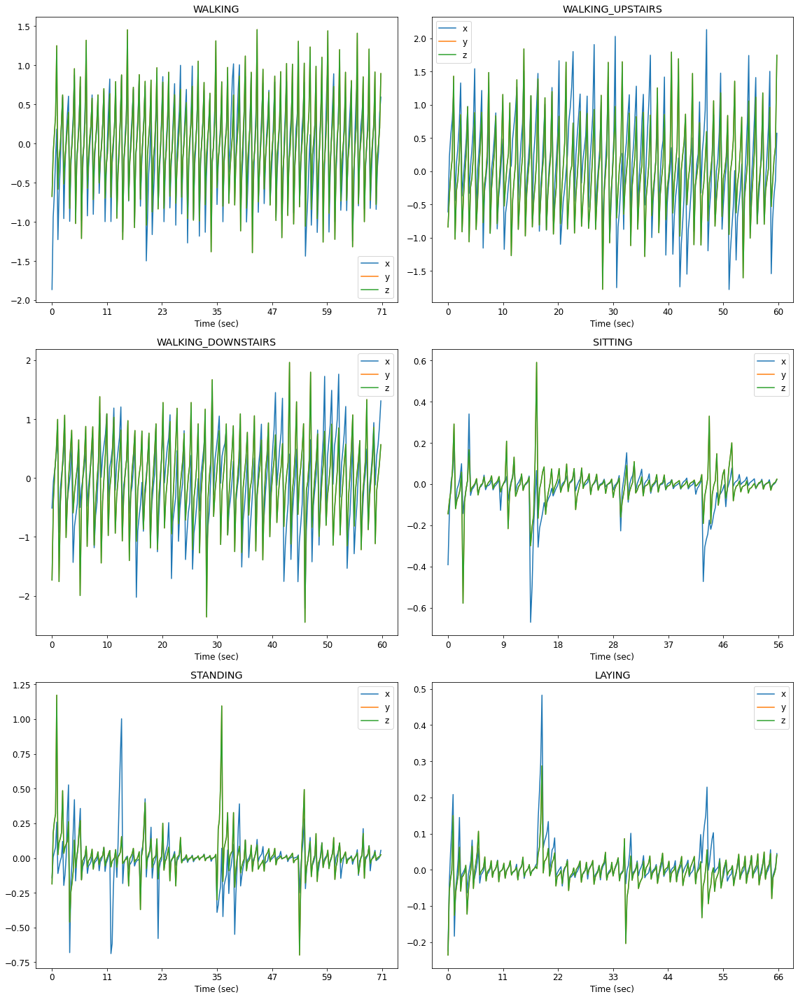

In [59]:
j = 5
mask = df_dict['body_gyro_x']['subject'] == j
x_subject_j = df_dict['body_gyro_x'][mask]
y_subject_j = df_dict['body_gyro_y'][mask]
z_subject_j = df_dict['body_gyro_y'][mask]

plt.figure(figsize=(16,20))
for i, activity in enumerate(activities.values(), 1):
    plt.subplot(3,2,i)
    mask = x_subject_j['activity'] == activity
    x = x_subject_j[mask].iloc[:, :-2].quantile([0, 0.25,0.5,0.75, 1], axis = 1).values.T.reshape(-1)
    y = y_subject_j[mask].iloc[:, :-2].quantile([0, 0.25,0.5,0.75, 1], axis = 1).values.T.reshape(-1)
    z = z_subject_j[mask].iloc[:, :-2].quantile([0, 0.25,0.5,0.75, 1], axis = 1).values.T.reshape(-1)
    plt.plot(x, label = 'x')
    plt.plot(y, label = 'y')
    plt.plot(z, label = 'z')
    plt.xticks(np.linspace(0, x.size, 7), np.linspace(0, x.size*0.256, 7, dtype=int)) #1.28/5
    plt.xlabel('Time (sec)')
    plt.legend()
    plt.title(activity)
plt.tight_layout()
plt.show()

The body signal does not seem to capture relevant information.